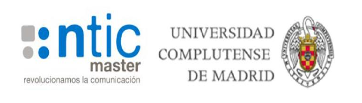

# NLP Deceitful Review Detection on e-Commerce and Social Media (2020)

This work is part of the final work to the <b>Master of Big Data and Business Analytics of the University Complutense of Madrid. 2019 - 2020.</b>

Authors: Marta Roig Atienza, Alejandra Lloret Calvo, Juan Pablo Guerrero Ortiz, Laura Débora Fernández Basquero, Ainhoa Rodrigo Bolea, Cristian Fernando Rodríguez Saldarriaga

# Libraries

In [1]:
import pandas as pd
import numpy as np
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
import plotly.graph_objs as go
import chart_studio.plotly as py
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from collections import Counter
import scattertext as st
import spacy
from pprint import pprint
from tabulate import tabulate
import plotly.express as px

Loading BokehJS ...

# Preliminary data cleaning analysis

In [2]:
# Firstly, we import our dataset
import pandas as pd
df = pd.read_csv("amazon_reviews.txt", sep='\t')

In [3]:
# Dataframe preview
df.head()

,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT
0,1,__label1__,4,N,PC,B00008NG7N,"Targus PAUK10U Ultra Mini USB Keypad, Black",useful,"When least you think so, this product will sav..."
1,2,__label1__,4,Y,Wireless,B00LH0Y3NM,Note 3 Battery : Stalion Strength Replacement ...,New era for batteries,Lithium batteries are something new introduced...
2,3,__label1__,3,N,Baby,B000I5UZ1Q,"Fisher-Price Papasan Cradle Swing, Starlight",doesn't swing very well.,I purchased this swing for my baby. She is 6 m...
3,4,__label1__,4,N,Office Products,B003822IRA,Casio MS-80B Standard Function Desktop Calculator,Great computing!,I was looking for an inexpensive desk calcolat...
4,5,__label1__,4,N,Beauty,B00PWSAXAM,Shine Whitening - Zero Peroxide Teeth Whitenin...,Only use twice a week,I only use it twice a week and the results are...


Analysing the dataset's preview, there are some basic cleaning data steps that we should carry out:
- Variable "VERIFIED_PURCHASE": to convert the "Y" into 1 and the "N" into 0.
- Variable "VERIFIED_PURCHASE": to convert the <i>label1</i> into <i>fake</i> and <i>label2</i> into <i>true</i>.
- Ensuring that any variable has missing values.
- To convert all the letters to lower case.

In [4]:
# Basic cleaning data steps
import re, string
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('english'))

# 1- "VERIFIED_PURCHASE": to convert the "Y" into 1 and the "N" into 0 and Variable "VERIFIED_PURCHASE": to convert the label1 into fake and label2 into true.
df["VERIFIED_PURCHASE"].replace({"Y": 1, "N": 0}, inplace=True)
df["LABEL"].replace({"__label1__": "fake", "__label2__": "true"}, inplace=True)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Marta\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
# 2- Ensuring that any variable has missing values.
df.isnull().values.any()

False

In [6]:
# 3- To convert all the letters to lower case
def clean_text(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = text.lower()
    #text = re.sub(r'\[.*?\]', '', text) # text in square brackets
    text = re.sub(r'[%s]' % re.escape(string.punctuation), '',
                  text)  # out punctuations
    text = re.sub(r'\w*\d\w*', '', text)  # out numbers
    text = text.replace("(<br/>)", "")
    text = text.replace('(<a).*(>).*(</a>)', '')
    text = text.replace('(&amp)', '')
    text = text.replace('(&gt)', '')
    text = text.replace('(&lt)', '')
    text = text.replace('(\xa0)', ' ')
    if len(text) > 2:
        return ' '.join(word for word in text.split() if word not in STOPWORDS)


for n in range(6, 9):
    df.iloc[:, n] = pd.DataFrame(df.iloc[:, n].apply(lambda x: clean_text(x)))

In [7]:
df.head()

,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT
0,1,fake,4,0,PC,B00008NG7N,targus ultra mini usb keypad black,useful,least think product save day keep around case ...
1,2,fake,4,1,Wireless,B00LH0Y3NM,note battery stalion strength replacement liio...,new era batteries,lithium batteries something new introduced mar...
2,3,fake,3,0,Baby,B000I5UZ1Q,fisherprice papasan cradle swing starlight,doesnt swing well,purchased swing baby months pretty much grown ...
3,4,fake,4,0,Office Products,B003822IRA,casio standard function desktop calculator,great computing,looking inexpensive desk calcolatur works ever...
4,5,fake,4,0,Beauty,B00PWSAXAM,shine whitening zero peroxide teeth whitening ...,use twice week,use twice week results great used teeth whiten...


# Feature engineering
- Using TextBlob to calculate sentiment polarity which lies in the range of [-1,1] where 1 means positive sentiment and -1 means a negative sentiment.
- Create new feature for the length of the review.
- Create new feature for the word count of the review.

In [8]:
from textblob import TextBlob
df['polarity'] = df['REVIEW_TEXT'].map(
    lambda text: TextBlob(text).sentiment[0])
df['subjectivity'] = df['REVIEW_TEXT'].map(
    lambda text: TextBlob(text).sentiment[1])
df['review_len'] = df['REVIEW_TEXT'].astype(str).apply(len)
df['word_count'] = df['REVIEW_TEXT'].apply(lambda x: len(str(x).split()))

# Exploratory Data Analysis 

## Univariate visualization analyses 

In [9]:
cufflinks.set_config_file(offline=True)
df['polarity'].iplot(kind='hist',
                     bins=50,
                     xTitle='polarity',
                     linecolor='black',
                     yTitle='count',
                     colors='rgb(19, 240, 146)',
                     title='Figure 1. Amazon Reviews Sentiment Polarity Distribution')

Figure 1 exhibits the sentiment polarity of Amazon's reviews. The majority of the scores are above zero, meaning that the most of the reviews are written in a positive sense.

In [10]:
df['RATING'].iplot(kind='hist',
                   xTitle='rating',
                   linecolor='black',
                   yTitle='count',
                   colors='rgb(19, 240, 146)',
                   title='Figure 2. Review Rating Distribution')

Figure 2 shows the distribution of the rating set for each product by each review. Many of the rating are around 4 and 5, these results are aligned with the figure 1. 

In [11]:
df['review_len'].iplot(kind='hist',
                       bins=100,
                       xTitle='review length',
                       linecolor='black',
                       yTitle='count',
                       colors='rgb(19, 240, 146)',
                       title='Figure 3. Review Text Length Distribution')

Figure 3 exhibits the distribution of the lenght of the reviews. The majority of the reviews could fit perfectly in a tweet (two hundred eighty characters).

In [12]:
df['word_count'].iplot(kind='hist',
                       bins=100,
                       xTitle='word count',
                       linecolor='black',
                       yTitle='count',
                       colors='rgb(19, 240, 146)',
                       title='Figure 4. Review Text Word Count Distribution')

Figure 4 displays the distribution of the number of words of the reviews. In general, our population preffers to leave short reviews.

In [13]:
df.groupby('PRODUCT_CATEGORY').count()['PRODUCT_ID'].sort_values(
    ascending=False).iplot(kind='bar',
                           yTitle='Count',
                           linecolor='black',
                           opacity=0.8,
                           colors='rgb(19, 240, 146)',
                           title='FIgure 5. Bar chart of Product Category',
                           xTitle='Product category')

Figure 5 shows the number of reviews of each category, as we can see it is a equidistributed dataset, which contains exactly 700 revieews of each product category. 

In [14]:
from tabulate import tabulate

def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(1,1).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx])
                  for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df['REVIEW_TEXT'], 20)

print(
    tabulate(common_words,
             headers=["Word", "Frequency"],
             tablefmt="fancy_grid"))

df1 = pd.DataFrame(common_words, columns=['REVIEW_TEXT', 'count'])
df1['polarity'] = df1['REVIEW_TEXT'].map(
    lambda text: TextBlob(text).sentiment[0])
fig = px.bar(df1, x='REVIEW_TEXT',y='count',hover_data=['polarity'],color='polarity',color_continuous_scale=px.colors.diverging.RdYlGn, labels={'count':'Albsolute frequency','REVIEW_TEXT':'Word'},height=400)
fig.show()

╒═════════╤═════════════╕
│ Word    │   Frequency │
╞═════════╪═════════════╡
│ one     │        6485 │
├─────────┼─────────────┤
│ great   │        6484 │
├─────────┼─────────────┤
│ br      │        6033 │
├─────────┼─────────────┤
│ like    │        5623 │
├─────────┼─────────────┤
│ good    │        5134 │
├─────────┼─────────────┤
│ would   │        4346 │
├─────────┼─────────────┤
│ use     │        4317 │
├─────────┼─────────────┤
│ really  │        4204 │
├─────────┼─────────────┤
│ well    │        3970 │
├─────────┼─────────────┤
│ product │        3660 │
├─────────┼─────────────┤
│ get     │        3592 │
├─────────┼─────────────┤
│ love    │        3469 │
├─────────┼─────────────┤
│ time    │        3234 │
├─────────┼─────────────┤
│ quality │        3117 │
├─────────┼─────────────┤
│ also    │        2943 │
├─────────┼─────────────┤
│ much    │        2765 │
├─────────┼─────────────┤
│ price   │        2668 │
├─────────┼─────────────┤
│ dont    │        2618 │
├─────────┼─

Figure 6 exhibits the 20 more frequent words. As it can be seen, the words highlighted are with positive meaning.

In [15]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx])
                  for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['REVIEW_TEXT'], 20)
print(
    tabulate(common_words,
             headers=["Bigram", "Frequency"],
             tablefmt="fancy_grid"))

df3 = pd.DataFrame(common_words, columns=['REVIEW_TEXT', 'count'])
df3['polarity'] = df3['REVIEW_TEXT'].map(
    lambda text: TextBlob(text).sentiment[0])
fig = px.bar(df3, x='REVIEW_TEXT',y='count',hover_data=['polarity'],color='polarity',color_continuous_scale=px.colors.diverging.RdYlGn, labels={'count':'Albsolute frequency','REVIEW_TEXT':'Bigram'},height=400)
fig.show()

╒══════════════════╤═════════════╕
│ Bigram           │   Frequency │
╞══════════════════╪═════════════╡
│ would recommend  │         530 │
├──────────────────┼─────────────┤
│ highly recommend │         511 │
├──────────────────┼─────────────┤
│ works great      │         433 │
├──────────────────┼─────────────┤
│ easy use         │         400 │
├──────────────────┼─────────────┤
│ good quality     │         377 │
├──────────────────┼─────────────┤
│ works well       │         336 │
├──────────────────┼─────────────┤
│ well made        │         334 │
├──────────────────┼─────────────┤
│ much better      │         324 │
├──────────────────┼─────────────┤
│ great product    │         307 │
├──────────────────┼─────────────┤
│ high quality     │         304 │
├──────────────────┼─────────────┤
│ really like      │         302 │
├──────────────────┼─────────────┤
│ year old         │         298 │
├──────────────────┼─────────────┤
│ great price      │         271 │
├──────────────────┼

Figure 7 shows the top 20 bigram and such as Figure 6, these are related with positive purchase sentiment. 

In [16]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx])
                  for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_trigram(df['REVIEW_TEXT'], 20)
print(
    tabulate(common_words,
             headers=["Bigram", "Frequency"],
             tablefmt="fancy_grid"))
colors =  ['rgb(19, 240, 146)',]*20
colors [0] = 'rgb(211,39,2)'

df6 = pd.DataFrame(common_words, columns=['REVIEW_TEXT', 'count'])

df6['polarity'] = df6['REVIEW_TEXT'].map(
    lambda text: TextBlob(text).sentiment[0])
fig = px.bar(df6, x='REVIEW_TEXT',y='count',hover_data=['polarity'],color='polarity',color_continuous_scale=px.colors.diverging.RdYlGn,labels={'count':'Albsolute frequency','REVIEW_TEXT':'Trigram'},height=400)
fig.show()

╒══════════════════════════════╤═════════════╕
│ Bigram                       │   Frequency │
╞══════════════════════════════╪═════════════╡
│ dont waste money             │          48 │
├──────────────────────────────┼─────────────┤
│ year old son                 │          45 │
├──────────────────────────────┼─────────────┤
│ highly recommend product     │          39 │
├──────────────────────────────┼─────────────┤
│ love love love               │          38 │
├──────────────────────────────┼─────────────┤
│ hope review helpful          │          30 │
├──────────────────────────────┼─────────────┤
│ br highly recommend          │          30 │
├──────────────────────────────┼─────────────┤
│ year old daughter            │          27 │
├──────────────────────────────┼─────────────┤
│ looks like picture           │          24 │
├──────────────────────────────┼─────────────┤
│ great product great          │          21 │
├──────────────────────────────┼─────────────┤
│ im happy pu

Figure 8 displays the top 20 trigram. Surprisingly, the top 1 is linked with a negative purchase sentiment.

In [17]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

blob = TextBlob(str(df['REVIEW_TEXT']))
pos_df = pd.DataFrame(blob.tags, columns=['word', 'pos'])
pos_df = pos_df.pos.value_counts()[:20]
pos_df.iplot(kind='bar',
             xTitle='POS',
             yTitle='count',
             colors='rgb(19, 240, 146)')
             #title='Figure 9. Top 20 Part-of-speech tagging for review corpus')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Marta\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Marta\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

Figure 9 shows the top 20 Part-of-speech tagging for the reviews. The Part-of-speech is the process of classifing words into their parts of speech and labeling them accordinglly. Parts of Speech are also known as word classes or lexical categories. The collection of tags used for a particular task is known as a tagset.

As follows, using the library nltk, we can see the description of each tag. Specifically, we are interested on the meaning of NN, JJ, CD and NNS.  The vast majority are singular nouns (NN), adjectives (JJ), numerals and cardinals (CD), and plural nouns (NNS).

In [18]:
nltk.download('tagsets')
nltk.help.upenn_tagset()

[nltk_data] Downloading package tagsets to
[nltk_data]     C:\Users\Marta\AppData\Roaming\nltk_data...
[nltk_data]   Package tagsets is already up-to-date!


True

$: dollar
    $ -$ --$ A$ C$ HK$ M$ NZ$ S$ U.S.$ US$
'': closing quotation mark
    ' ''
(: opening parenthesis
    ( [ {
): closing parenthesis
    ) ] }
,: comma
    ,
--: dash
    --
.: sentence terminator
    . ! ?
:: colon or ellipsis
    : ; ...
CC: conjunction, coordinating
    & 'n and both but either et for less minus neither nor or plus so
    therefore times v. versus vs. whether yet
CD: numeral, cardinal
    mid-1890 nine-thirty forty-two one-tenth ten million 0.5 one forty-
    seven 1987 twenty '79 zero two 78-degrees eighty-four IX '60s .025
    fifteen 271,124 dozen quintillion DM2,000 ...
DT: determiner
    all an another any both del each either every half la many much nary
    neither no some such that the them these this those
EX: existential there
    there
FW: foreign word
    gemeinschaft hund ich jeux habeas Haementeria Herr K'ang-si vous
    lutihaw alai je jour objets salutaris fille quibusdam pas trop Monte
    terram fiche oui corporis ...
IN: preposition or

Firstly, we have grouped the thirty product categories in a High-Level Category classifications, resulting in the following table:

High-Level Product Categories | Original Product Categories | Number of reviews
:--------: | ------- | -------
<b> Home </b> | Home, Home Entertainment, Home Improvement | 2100
<b> Furniture </b> | Furniture, Lawn and Garden, Outdoors, Kitchen | 2800 
<b> Electronics </b> | Electronics, Video DVD, Video Games, Camera, Tools, PC, Wireless | 4900
<b> Music & Books </b> | Books, Musical Instruments | 1400
<b> Health </b> | Health & Personal Care, Beauty | 1400
<b> Baby </b> | Baby | 700
<b> Jewelry </b> | Jewelry, Watches, Luggage | 2100
<b> Others </b> | Pet Products, Toys, Glocery, Office Products | 2800
<b> Sports </b> | Sports | 700
<b> Automotive </b> | Automotive | 700
<b> Apparel </b> | Apparel, Shoes | 1400

Previously, we have analysed the full distribution of the dataset for each relevant variable.  Now, we are going to carry out some boxplot analyses for each High-Level Product Category, in order to study if there is any difference between them.

In [19]:
home = df.loc[(df['PRODUCT_CATEGORY'] == 'Home') |
              (df['PRODUCT_CATEGORY'] == 'Home Entertainment') |
              (df['PRODUCT_CATEGORY'] == 'Home Improvement')]['polarity']

furniture = df.loc[(df['PRODUCT_CATEGORY'] == 'Furniture') |
                   (df['PRODUCT_CATEGORY'] == 'Lawn and Garden') |
                   (df['PRODUCT_CATEGORY'] == 'Outdoors') |
                   (df['PRODUCT_CATEGORY'] == 'Kitchen')]['polarity']

electronics = df.loc[(df['PRODUCT_CATEGORY'] == 'Video DVD') |
                     (df['PRODUCT_CATEGORY'] == 'Video Games') |
                     (df['PRODUCT_CATEGORY'] == 'Electronics') |
                     (df['PRODUCT_CATEGORY'] == 'Camera') |
                     (df['PRODUCT_CATEGORY'] == 'PC') |
                     (df['PRODUCT_CATEGORY'] == 'Wireless') |
                     (df['PRODUCT_CATEGORY'] == 'Tools')]['polarity']

musicbooks = df.loc[(df['PRODUCT_CATEGORY'] == 'Books') |
                    (df['PRODUCT_CATEGORY'] == 'Musical Instruments')]['polarity']

health = df.loc[(df['PRODUCT_CATEGORY'] == 'Health & Personal Care') |
                (df['PRODUCT_CATEGORY'] == 'Beauty')]['polarity']

baby = df.loc[(df['PRODUCT_CATEGORY'] == 'Baby')]['polarity']

jewelry = df.loc[(df['PRODUCT_CATEGORY'] == 'Jewelry') |
                 (df['PRODUCT_CATEGORY'] == 'Watches') |
                 (df['PRODUCT_CATEGORY'] == 'Luggage')]['polarity']

others = df.loc[(df['PRODUCT_CATEGORY'] == 'Pet Products') |
                (df['PRODUCT_CATEGORY'] == 'Toys') |
                (df['PRODUCT_CATEGORY'] == 'Grocery') |
                (df['PRODUCT_CATEGORY'] == 'Office Products')]['polarity']

sports = df.loc[(df['PRODUCT_CATEGORY'] == 'Sports')]['polarity']

auto = df.loc[(df['PRODUCT_CATEGORY'] == 'Automotive')]['polarity']

apparel = df.loc[(df['PRODUCT_CATEGORY'] == 'Shoes') |
                (df['PRODUCT_CATEGORY'] == 'Apparel')]['polarity']


trace0 = go.Box(y=home, name='Home', marker=dict(color='rgb(214, 12, 140)', ))
trace1 = go.Box(y=furniture, name='Furniture', marker=dict(color='rgb(0, 128, 128)', ))
trace2 = go.Box(y=electronics, name='Electronics', marker=dict(color='rgb(10, 140, 208)', ))
trace3 = go.Box(y=musicbooks, name='Music & Books', marker=dict(color='rgb(12, 102, 14)', ))
trace4 = go.Box(y=health , name='Health', marker=dict(color='rgb(10, 0, 100)', ))
trace5 = go.Box(y=baby, name='Baby', marker=dict(color='rgb(100, 0, 10)', ))
trace6 = go.Box(y=jewelry, name='Jewelry', marker=dict(color='rgb(255, 87, 51)', ))
trace7 = go.Box(y=others, name='Others', marker=dict(color='rgb(51, 255, 162)', ))
trace8 = go.Box(y=sports, name='Sports', marker=dict(color='rgb(191, 126, 234)', ))
trace9 = go.Box(y=auto, name='Automotive', marker=dict(color='rgb(234, 126, 147)', ))
trace10 = go.Box(y=apparel, name='Apparel', marker=dict(color='rgb(126, 22, 234)', ))

data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8, trace9, trace10]
layout = go.Layout(title="Figure 10. Sentiment Polarity Boxplot of Product Category")

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="Sentiment Polarity Boxplot of Product Category")

Figure 10 exhibits the Sentiment Polatiry Boxplot for each High-level product category. Some facts may be emphasized:
- Jewelry and Apparel are the two categories with the highest median.
- Most of the values of the distribution are accumulated above zero. Meaning that, most of the reviews are written in a positive sense.
- Home, Electronics, Furniture, Jewelry and Others have many outliers in the left tail. At first glance, it seems that we are working with left heavy-tailed distributions. 

In [20]:
home = df.loc[(df['PRODUCT_CATEGORY'] == 'Home') |
              (df['PRODUCT_CATEGORY'] == 'Home Entertainment') |
              (df['PRODUCT_CATEGORY'] == 'Home Improvement')]['RATING']

furniture = df.loc[(df['PRODUCT_CATEGORY'] == 'Furniture') |
                   (df['PRODUCT_CATEGORY'] == 'Lawn and Garden') |
                   (df['PRODUCT_CATEGORY'] == 'Outdoors') |
                   (df['PRODUCT_CATEGORY'] == 'Kitchen')]['RATING']

electronics = df.loc[(df['PRODUCT_CATEGORY'] == 'Video DVD') |
                     (df['PRODUCT_CATEGORY'] == 'Video Games') |
                     (df['PRODUCT_CATEGORY'] == 'Electronics') |
                     (df['PRODUCT_CATEGORY'] == 'Camera') |
                     (df['PRODUCT_CATEGORY'] == 'Tools') |
                     (df['PRODUCT_CATEGORY'] == 'Wireless') |
                     (df['PRODUCT_CATEGORY'] == 'PC')]['RATING']

musicbooks = df.loc[(df['PRODUCT_CATEGORY'] == 'Books') |
                    (df['PRODUCT_CATEGORY'] == 'Musical Instruments')]['RATING']

health = df.loc[(df['PRODUCT_CATEGORY'] == 'Health & Personal Care') |
                (df['PRODUCT_CATEGORY'] == 'Beauty')]['RATING']

baby = df.loc[(df['PRODUCT_CATEGORY'] == 'Baby')]['RATING']

jewelry = df.loc[(df['PRODUCT_CATEGORY'] == 'Jewelry') |
                 (df['PRODUCT_CATEGORY'] == 'Watches') |
                 (df['PRODUCT_CATEGORY'] == 'Luggage')]['RATING']

others = df.loc[(df['PRODUCT_CATEGORY'] == 'Pet Products') |
                (df['PRODUCT_CATEGORY'] == 'Toys') |
                (df['PRODUCT_CATEGORY'] == 'Grocery') |
                (df['PRODUCT_CATEGORY'] == 'Office Products')]['RATING']

sports = df.loc[(df['PRODUCT_CATEGORY'] == 'Sports')]['RATING']

auto = df.loc[(df['PRODUCT_CATEGORY'] == 'Automotive')]['RATING']

apparel = df.loc[(df['PRODUCT_CATEGORY'] == 'Shoes') |
                (df['PRODUCT_CATEGORY'] == 'Apparel')]['RATING']


trace0 = go.Box(y=home, name='Home', marker=dict(color='rgb(214, 12, 140)', ))
trace1 = go.Box(y=furniture, name='Furniture', marker=dict(color='rgb(0, 128, 128)', ))
trace2 = go.Box(y=electronics, name='Electronics', marker=dict(color='rgb(10, 140, 208)', ))
trace3 = go.Box(y=musicbooks, name='Music & Books', marker=dict(color='rgb(12, 102, 14)', ))
trace4 = go.Box(y=health , name='Health', marker=dict(color='rgb(10, 0, 100)', ))
trace5 = go.Box(y=baby, name='Baby', marker=dict(color='rgb(100, 0, 10)', ))
trace6 = go.Box(y=jewelry, name='Jewelry', marker=dict(color='rgb(255, 87, 51)', ))
trace7 = go.Box(y=others, name='Others', marker=dict(color='rgb(51, 255, 162)', ))
trace8 = go.Box(y=sports, name='Sports', marker=dict(color='rgb(191, 126, 234)', ))
trace9 = go.Box(y=auto, name='Automotive', marker=dict(color='rgb(234, 126, 147)', ))
trace10 = go.Box(y=apparel, name='Apparel', marker=dict(color='rgb(126, 22, 234)', ))

data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8, trace9, trace10]
layout = go.Layout(title="Figure 11. Rating Boxplot of Product Category")

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="Rating Boxplot of Product Category")

Figure 11 displays the distribution of each High-level category based on the rating. We can appreciate how all the distribution is concentrated between the ratings 4 and 5, excluding Baby and Others categories, for which the distribution is concentrated between rating 3 and 5. In short, most of the products, independtly of the category, are well rated. 

In [21]:
home = df.loc[(df['PRODUCT_CATEGORY'] == 'Home') |
              (df['PRODUCT_CATEGORY'] == 'Home Entertainment') |
              (df['PRODUCT_CATEGORY'] == 'Home Improvement')]['review_len']

furniture = df.loc[(df['PRODUCT_CATEGORY'] == 'Furniture') |
                   (df['PRODUCT_CATEGORY'] == 'Lawn and Garden') |
                   (df['PRODUCT_CATEGORY'] == 'Outdoors') |
                   (df['PRODUCT_CATEGORY'] == 'Kitchen')]['review_len']

electronics = df.loc[(df['PRODUCT_CATEGORY'] == 'Video DVD') |
                     (df['PRODUCT_CATEGORY'] == 'Video Games') |
                     (df['PRODUCT_CATEGORY'] == 'Electronics') |
                     (df['PRODUCT_CATEGORY'] == 'Camera') |
                     (df['PRODUCT_CATEGORY'] == 'Tools') |
                     (df['PRODUCT_CATEGORY'] == 'Wireless') |
                     (df['PRODUCT_CATEGORY'] == 'PC')]['review_len']

musicbooks = df.loc[(df['PRODUCT_CATEGORY'] == 'Books') |
                    (df['PRODUCT_CATEGORY'] == 'Musical Instruments')]['review_len']

health = df.loc[(df['PRODUCT_CATEGORY'] == 'Health & Personal Care') |
                (df['PRODUCT_CATEGORY'] == 'Beauty')]['review_len']

baby = df.loc[(df['PRODUCT_CATEGORY'] == 'Baby')]['review_len']

jewelry = df.loc[(df['PRODUCT_CATEGORY'] == 'Jewelry') |
                 (df['PRODUCT_CATEGORY'] == 'Watches') |
                 (df['PRODUCT_CATEGORY'] == 'Luggage')]['review_len']

others = df.loc[(df['PRODUCT_CATEGORY'] == 'Pet Products') |
                (df['PRODUCT_CATEGORY'] == 'Toys') |
                (df['PRODUCT_CATEGORY'] == 'Grocery') |
                (df['PRODUCT_CATEGORY'] == 'Office Products')]['review_len']

sports = df.loc[(df['PRODUCT_CATEGORY'] == 'Sports')]['review_len']

auto = df.loc[(df['PRODUCT_CATEGORY'] == 'Automotive')]['review_len']

apparel = df.loc[(df['PRODUCT_CATEGORY'] == 'Shoes') |
                (df['PRODUCT_CATEGORY'] == 'Apparel')]['review_len']


trace0 = go.Box(y=home, name='Home', marker=dict(color='rgb(214, 12, 140)', ))
trace1 = go.Box(y=furniture, name='Furniture', marker=dict(color='rgb(0, 128, 128)', ))
trace2 = go.Box(y=electronics, name='Electronics', marker=dict(color='rgb(10, 140, 208)', ))
trace3 = go.Box(y=musicbooks, name='Music & Books', marker=dict(color='rgb(12, 102, 14)', ))
trace4 = go.Box(y=health , name='Health', marker=dict(color='rgb(10, 0, 100)', ))
trace5 = go.Box(y=baby, name='Baby', marker=dict(color='rgb(100, 0, 10)', ))
trace6 = go.Box(y=jewelry, name='Jewelry', marker=dict(color='rgb(255, 87, 51)', ))
trace7 = go.Box(y=others, name='Others', marker=dict(color='rgb(51, 255, 162)', ))
trace8 = go.Box(y=sports, name='Sports', marker=dict(color='rgb(191, 126, 234)', ))
trace9 = go.Box(y=auto, name='Automotive', marker=dict(color='rgb(234, 126, 147)', ))
trace10 = go.Box(y=apparel, name='Apparel', marker=dict(color='rgb(126, 22, 234)', ))

data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8, trace9, trace10]
layout = go.Layout(title="Review lenght Boxplot of Product Category")

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="Review lenght Boxplot of Product Category")

Figure 12 shows the boxplot of each high-level category based on the review lenght. The longest reviews are found in Home, Electronics, Music & Books, Others and Sports categories. The type of products that we can found among these categories normally are expensive, so the clients are grateful if them work as it is expected. 

## Bivariate Visualization Analyses

In the following section, we are going to make use of Bivariate visualization, which consists on studying two features at a time, describing association or relationship between two features.

In [22]:
x1 = df.loc[(df['RATING'] == 4) | (df['RATING'] == 5), 'polarity']
x0 = df.loc[(df['RATING'] == 2) | (df['RATING'] == 1), 'polarity']

trace1 = go.Histogram(
    x=x0, name='Bad rating',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Good rating',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of Sentiment polarity of reviews based on Good/Bad rating')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

Figure 13 displays the distribution of sentiment polarity of reviews based on Good (reviews with a rating of 4 or 5) or Bad rating (). As it can be seen, the reviews that have higher polarity score are more likely to be well rated.

In [23]:
x1 = df.loc[(df['RATING'] == 4) | (df['RATING'] == 5), 'subjectivity']
x0 = df.loc[(df['RATING'] == 2) | (df['RATING'] == 1), 'subjectivity']

trace1 = go.Histogram(
    x=x0, name='Bad rating',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Good rating',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of Sentiment Subjectivity of reviews based on Good/Bad rating')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

Figure 14 shows the distribution of sentiment subjectivity of reviews based of Bad or Good rating. The distribution of good rating reviews is closer to a normal distribution, while the bad rating distribution is platykurtic, this means that the curve's tails at both sides are fatter as a result of it being higher.  

In [24]:
x1 = df.loc[df['VERIFIED_PURCHASE'] == 1, 'RATING']
x0 = df.loc[df['VERIFIED_PURCHASE'] == 0, 'RATING']

trace1 = go.Histogram(
    x=x0, name='Not Verified',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Verified',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Figure 15. Distribution of Rating of reviews based on Verified Purchase or not')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

Figure 15 exhibits the distribution of rating of reviews based on if the purchase has been verified or not. There are more verified purchases than not verified and the majority of them scores with the highest rating. 

In [25]:
x1 = df.loc[df['LABEL'] == "true", 'VERIFIED_PURCHASE']
x0 = df.loc[df['LABEL'] == "fake", 'VERIFIED_PURCHASE']

trace1 = go.Histogram(
    x=x0, name='fake',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'true',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Figure 16. Distribution of Fake or True reviews based on Verified Purchase or not')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

Figure 16 displays the distribution of fake and true reviews based on virified purchase or not. As we can appreciate, true (fake) reviews are more likely to be a (not) verified purchase. 

In [26]:
x1 = df.loc[(df['RATING'] == 4) | (df['RATING'] == 5), 'review_len']
x0 = df.loc[(df['RATING'] == 2) | (df['RATING'] == 1), 'review_len']

trace1 = go.Histogram(
    x=x0, name='Bad rating',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Good rating',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Figure 17. Distribution of the rating of reviews based on review lenght')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

Figure 17 shows the distribution of the rating of reviews based on its lenght. The longest reviews are at the same time good rating reviews.

In [27]:
trace1 = go.Scatter(
    x=df['polarity'], y=df['RATING'], mode='markers', name='points',
    marker=dict(color='rgb(102,0,0)', size=2, opacity=0.4)
)
trace2 = go.Histogram2dContour(
    x=df['polarity'], y=df['RATING'], name='density', ncontours=20,
    colorscale='Hot', reversescale=True, showscale=False
)
trace3 = go.Histogram(
    x=df['polarity'], name='Sentiment polarity density',
    marker=dict(color='rgb(102,0,0)'),
    yaxis='y2'
)
trace4 = go.Histogram(
    y=df['RATING'], name='Rating density', marker=dict(color='rgb(102,0,0)'),
    xaxis='x2'
)
data = [trace1, trace2, trace3, trace4]

layout = go.Layout(
    showlegend=False,
    autosize=False,
    width=900,
    height=850,
    xaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    margin=dict(
        t=50
    ),
    hovermode='closest',
    bargap=0,
    xaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    ),
    yaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    )
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='2dhistogram-2d-density-plot-subplots')

In [29]:
fig = px.scatter(df, x='polarity', y='subjectivity',
                    color='RATING')
fig.show()

## word2vec Embedding
Word2vec embedding is a technique for NLP that uses a newral network model to learn word associations from a large corpus of text.
Firstly, we need to lemmatize the reviews text before training. Lemmatization is the process of grouping together the different inflected forms of a word so they can be analysed as a single item. By this way, we do not end up losing the relationship between some of the english words which has different forms.

In [31]:
import en_core_web_sm
nlp = en_core_web_sm.load()


def lemmatizer(text):
    sent = []
    doc = nlp(text)
    for word in doc:
        sent.append(word.lemma_)
    return " ".join(sent)


reviews_text_clean = df['REVIEW_TEXT'].to_frame()
reviews_text_clean["text_lemmatize"] = reviews_text_clean.apply(
    lambda x: lemmatizer(x['REVIEW_TEXT']), axis=1)
reviews_text_clean['text_lemmatize_clean'] = reviews_text_clean[
    'text_lemmatize'].str.replace('-PRON-', '')

In [32]:
print(reviews_text_clean)

                                             REVIEW_TEXT  \
0      least think product save day keep around case ...   
1      lithium batteries something new introduced mar...   
2      purchased swing baby months pretty much grown ...   
3      looking inexpensive desk calcolatur works ever...   
4      use twice week results great used teeth whiten...   
...                                                  ...   
20995  bought work high arches use arch support heels...   
20996  crocs one two brands shoes feet day work love ...   
20997  love moccasins fit like custom made mebr soft ...   
20998  wish little durable got caught bolt crossing b...   
20999  ive looking replacement beloved kso treks owne...   

                                          text_lemmatize  \
0      least think product save day keep around case ...   
1      lithium battery something new introduce market...   
2      purchase swing baby month pretty much grow lou...   
3      look inexpensive desk calcolatur

In [33]:
from collections import defaultdict
sentences = [row.split() for row in reviews_text_clean['text_lemmatize_clean']]

Implementing Word2vec embedding in Gensim

- min_count: Minimum number of occurrences of a word in the corpus to be included in the model. The higher the number, the less words we have in our corpus.
- window: The maximum distance between the current and predicted word within a sentence.
- size: The dimensionality of the feature vectors.
- workers: I know my system is having 4 cores.
- model.build_vocab: Prepare the model vocabulary.
- model.train: Train word vectors.
- model.init_sims(): When we do not plan to train the model any further, we use this line of code to make the model more memory-efficient.

In [34]:
from gensim.models import Word2Vec
w2v_model = Word2Vec(min_count=200, window=5, size=100, workers=4)

w2v_model.build_vocab(sentences)
w2v_model.train(sentences,
                total_examples=w2v_model.corpus_count,
                epochs=w2v_model.iter)
w2v_model.init_sims(replace=True)

(1872254, 3644670)

Now we see those words that are positive and similar to the word good.

In [79]:
w2v_model.wv.most_similar(positive=['good'])

[('decent', 0.7555594444274902),
 ('great', 0.7363462448120117),
 ('amazing', 0.6786770820617676),
 ('excellent', 0.6712548732757568),
 ('fantastic', 0.6623961925506592),
 ('poor', 0.6097394227981567),
 ('high', 0.5903072357177734),
 ('overall', 0.5815927386283875),
 ('well', 0.5603851079940796),
 ('similar', 0.5312845706939697)]

The same but in this case with the word bad.

In [80]:
w2v_model.wv.most_similar(positive=['bad'])

[('difference', 0.8081632852554321),
 ('nothing', 0.7845568060874939),
 ('actually', 0.7395214438438416),
 ('maybe', 0.7284302711486816),
 ('guess', 0.7048289775848389),
 ('hear', 0.7043452262878418),
 ('believe', 0.6649717688560486),
 ('mention', 0.6545118689537048),
 ('happen', 0.6401199102401733),
 ('probably', 0.6367279291152954)]

Now, we want to compare the similarity between good and bad, to check how well is working our model.

In [81]:
w2v_model.wv.similarity('good', 'bad')

0.38316247

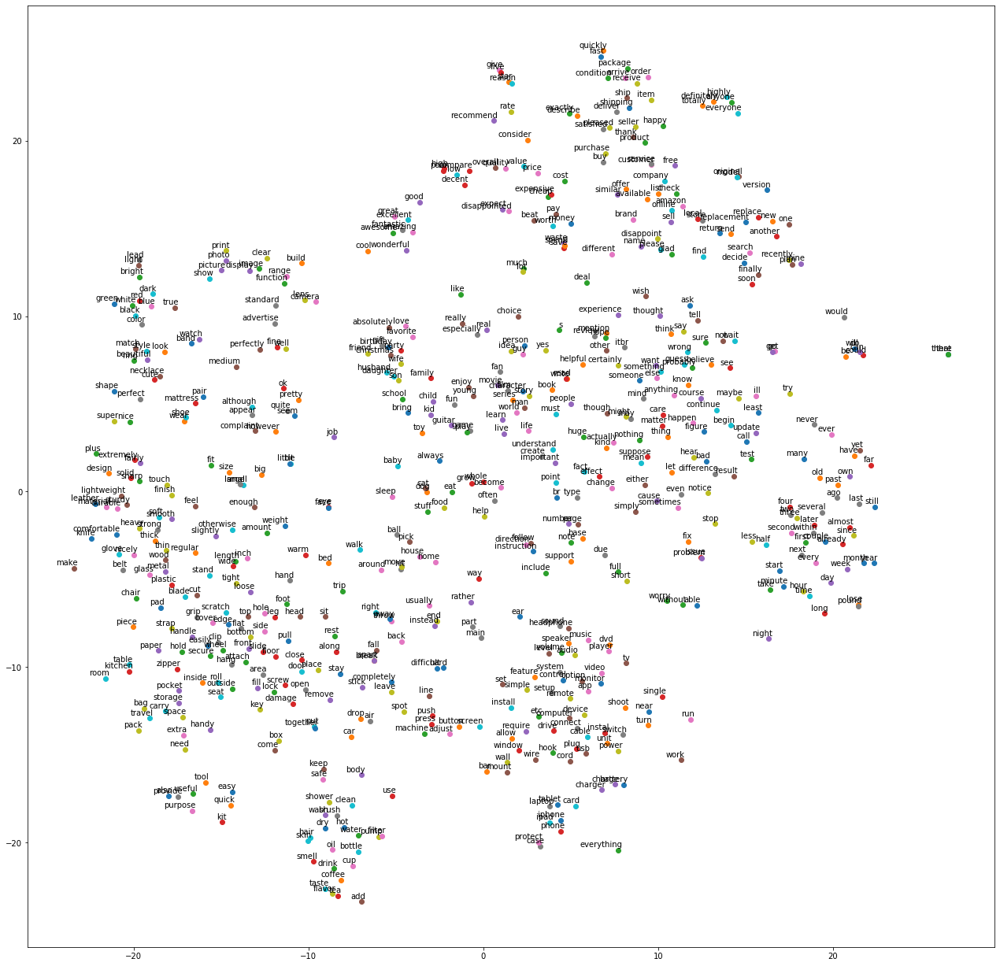

In [132]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


def tsne_plot(model):
    "Create TSNE model and plot it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)

    tsne_model = TSNE(perplexity=40,
                      n_components=2,
                      init='pca',
                      n_iter=2500,
                      random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(22, 22))
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()


tsne_plot(w2v_model)

## Finding characteristics terms and their associations

In [92]:
corpus = st.CorpusFromPandas(df,
                             category_col='PRODUCT_CATEGORY',
                             text_col="REVIEW_TEXT",
                             nlp=nlp).build()
print(list(corpus.get_scaled_f_scores_vs_background().index[:10]))

['itbr', 'iphone', 'nt', 'ipad', 'br', 'bluray', 'sturdy', 'wo', 'flimsy', 'wii']


In [113]:
term_freq_df = corpus.get_term_freq_df()

term_freq_df['Home Score'] = corpus.get_scaled_f_scores('Home')
print(list((term_freq_df.sort_values(by='Home Score', ascending=False).index[:10])))

term_freq_df['Electronics Score'] = corpus.get_scaled_f_scores('Electronics')
print(list(term_freq_df.sort_values(by='Electronics Score', ascending=False).index[:10]))

term_freq_df['Baby Score'] = corpus.get_scaled_f_scores('Baby')
print(list(term_freq_df.sort_values(by='Baby Score', ascending=False).index[:10]))

term_freq_df['Jewelry Score'] = corpus.get_scaled_f_scores('Jewelry')
print(list(term_freq_df.sort_values(by='Jewelry Score', ascending=False).index[:10]))

term_freq_df['Apparel Score'] = corpus.get_scaled_f_scores('Apparel')
print(list(term_freq_df.sort_values(by='Apparel Score', ascending=False).index[:10]))

['sewing machine', 'wagner', 'minwax', 'wood cleaner', 'comforter', 'steamer', 'sewing', 'air conditioner', 'minwax wood', 'shark']
['sennheisers', 'apc', 'skullcandy', 'earbuds', 'mono mode', 'bluetooth speaker', 'sol', 'theater receiver', 'set headphones', 'people hear']
['pacifier', 'crib', 'teething', 'high chair', 'newborn', 'graco', 'nipples', 'baby monitor', 'bib', 'baby loves']
['earrings', 'earring', 'sterling silver', 'cufflinks', 'sterling', 'love necklace', 'engagement', 'bought ring', 'pendant', 'piece jewelry']
['ralph', 'ralph lauren', 'lauren', 'robe', 'polo', 'shirts', 'hips', 'bathing suit', 'ordered large', 'blazer']


## Topic Modeling Review Text

In this section we are going to explore topic modeling algorithm applying Latent Semantic Analysis (LSA). This is a technique in natural language processing, in particular distributional semantics, of analyzing relationships between a set of terms by producing a set of concepts related to the terms. LSA assumes that words that are close in meaning will occur in similar pieces of text.

According to the high-level product category set above, we are going to create a new dataframe replacing the low-level category for each corresponding hihg-level category.

In [91]:
df_changed = df

df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Home Entertainment': "Home",
        'Home Improvement': "Home"
    }, inplace=True)
df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Lawn and Garden': "Furniture",
        'Outdoors': "Furniture",
        'Kitchen': "Furniture"
    },
    inplace=True)
df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Video DVD': "Electronics",
        'Video Games': "Electronics",
        "Camera": "Electronics",
        'Tools': "Electronics",
        'Wireless': "Electronics",
        'PC': "Electronics"
    },
    inplace=True)
df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Books': "Music & Books",
        'Musical Instruments': "Music & Books"
    },
    inplace=True)
df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Health & Personal Care': "Health",
        'Beauty': "Health"
    }, inplace=True)

df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Watches': "Jewelry",
        'Luggage': "Jewelry"
    }, inplace=True)
df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Pet Products': "Others",
        'Toys': "Others",
        'Grocery': "Others",
        'Office Products': "Others"
    },
    inplace=True)
df_changed["PRODUCT_CATEGORY"].replace(
    {
        'Shoes': "Apparel"
    }, inplace=True)

In [122]:
df_changed.head()

,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT,polarity,subjectivity,review_len,word_count
0,1,fake,4,0,Electronics,B00008NG7N,targus ultra mini usb keypad black,useful,least think product save day keep around case ...,-0.300000,0.400000,60,10
1,2,fake,4,1,Electronics,B00LH0Y3NM,note battery stalion strength replacement liio...,new era batteries,lithium batteries something new introduced mar...,0.219226,0.385320,291,40
2,3,fake,3,0,Baby,B000I5UZ1Q,fisherprice papasan cradle swing starlight,doesnt swing well,purchased swing baby months pretty much grown ...,0.366667,0.616667,133,21
3,4,fake,4,0,Others,B003822IRA,casio standard function desktop calculator,great computing,looking inexpensive desk calcolatur works ever...,-0.118056,0.255556,122,19
4,5,fake,4,0,Health,B00PWSAXAM,shine whitening zero peroxide teeth whitening ...,use twice week,use twice week results great used teeth whiten...,0.250000,0.575000,178,27


LSA MODEL

In [123]:
reindexed_data = df_changed['REVIEW_TEXT']
tfidf_vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, smooth_idf=True)
reindexed_data = reindexed_data.values
document_term_matrix = tfidf_vectorizer.fit_transform(reindexed_data)

In [124]:
n_topics = 11
lsa_model = TruncatedSVD(n_components = n_topics)
lsa_topic_matrix = lsa_model.fit_transform(document_term_matrix)

In [125]:
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [126]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [127]:
def get_top_n_words(n, keys, document_term_matrix, tfidf_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = tfidf_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
        top_words.append(" ".join(topic_words))         
    return top_words

In [128]:
top_n_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  great good like
Topic 2:  product great recommend
Topic 3:  watch looks great
Topic 4:  good quality watch
Topic 5:  bag leather size
Topic 6:  product hair love
Topic 7:  use easy bag
Topic 8:  love easy really
Topic 9:  like really feel
Topic 10:  br game book
Topic 11:  case phone fit


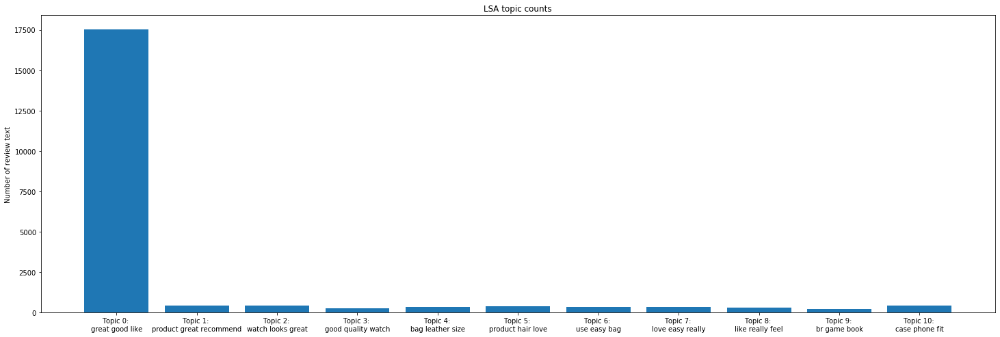

In [131]:
top_3_words = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(25,8))
ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels);
ax.set_ylabel('Number of review text');
ax.set_title('LSA topic counts');
plt.show();

__Project idea:__

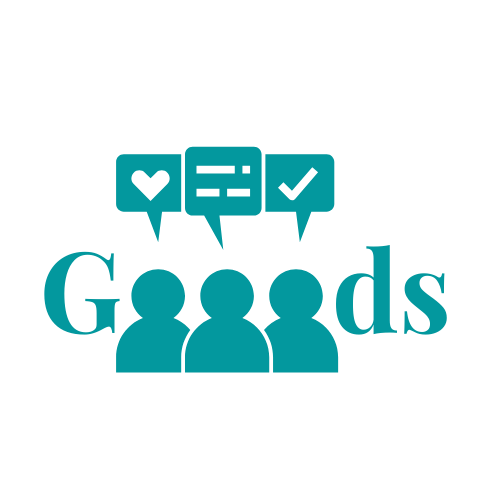

Developed by the following authors: 

 _Ainhoa Rodrigo Bolea (ainhoa2612@gmail.com)_
 
 _Alejandra Lloret Calvo (alejandralloretc@gmail.com)_
 
 _Cristian Fernando Rodríguez Saldarriaga (c.fernandoro@gmail.com)_

 _Juan Pablo Guerrero Ortiz (Jguerror41@gmail.com)_ 
 
 _Laura Débora Fernández Basquero (ldfernandez09@gmail.com)_
 
 _Marta Roig Atienza (martaroigatienza@hotmail.com)_
 
 
Based on the research work: **NLP Deceitful Review Detection on e-Commerce and Social Media (2020)**

This work is part of the final master thesis to the _Master of Big Data and Business Analytics of the University Complutense of Madrid. 2019 - 2020._

